<a href="https://colab.research.google.com/github/rara-by/vehicle-detection/blob/master/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#mounting Google Drive to access dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


####Libraries

In [ ]:
#importing dependancies
import shutil
import os, sys, random
import xml.etree.ElementTree as ET
from glob import glob
import pandas as pd
from shutil import copyfile
import pandas as pd
from sklearn import preprocessing, model_selection
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import os

####Pre processing 


**Dataset overview**

Inspecting the dataset manually revealed some partially visible vehicles were not labeled. This might affect the validation accuracy. Due to shortage of time, I have decided to make do with the annotations for the time being.

Number of train set - 439 images, <br>
valid set - 125 images, <br>
and test set - 63 images.

Total images in the dataset = 627<br>
This distribution has been done manually.


Images are of 416*416 size

**Labels**:<br>
Ambulance - 0<br>
Bus - 1<br>
Car - 2<br>
Motorcycle - 3<br>
Truck - 4<br>

#####YOLOv5s

In [ ]:
# cloning ultralytics github repository for training and object detection using YOLOv5
%cd '/content/drive/MyDrive/Projetcs/Animo.ai/'
!git clone  'https://github.com/ultralytics/yolov5.git'

/content/drive/MyDrive/Projetcs/Animo.ai
Cloning into 'yolov5'...
remote: Enumerating objects: 8099, done.
remote: Counting objects: 100% (411/411), done.
remote: Compressing objects: 100% (171/171), done.
remote: Total 8099 (delta 285), reused 345 (delta 240), pack-reused 7688
Receiving objects: 100% (8099/8099), 9.43 MiB | 10.45 MiB/s, done.
Resolving deltas: 100% (5581/5581), done.


In [ ]:
# install dependencies 
!pip install -qr '/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/requirements.txt'  #directory of cloned repo

In [ ]:
#adding labels to yolov5.yaml file
%cd '/content/drive/MyDrive/Projetcs/Animo.ai'
!echo -e 'train: /content/drive/MyDrive/Projetcs/Animo.ai/train\nval: /content/drive/MyDrive/Projetcs/Animo.ai/valid\n\nnc: 5\nnames: ['Ambulance' 'Bus' 'Car' 'Motorcycle' 'Truck']' >> yolov5.yaml
!cat 'yolov5.yaml'

/content/drive/MyDrive/Projetcs/Animo.ai

train: /content/drive/MyDrive/Projetcs/Animo.ai/train
val: /content/drive/MyDrive/Projetcs/Animo.ai/valid

nc: 5
names: [Ambulance Bus Car Motorcycle Truck]


**Also edit the number of classes (nc) in the ./models/*.yaml file**

In [ ]:
#Here I chose YOLO model yolov5s.yaml (yolo - small)
!sed -i 's/nc: 80/nc: 5/g' '/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/models/yolov5s.yaml'

# Training command

**Training Parameters**

!python 
- <'location of train.py file'> 
- --img <'width of image'>
- --batch <'batch size'>
- --epochs <'no of epochs'>
- --data <'location of the .yaml file'>
- --cfg <'Which yolo configuration you want'>(yolov5s/yolov5m/yolov5l/yolov5x).yaml | (small, medium, large, xlarge)
- --name <'Name of the best model after training'>

**METRICS FROM TRAINING PROCESS**

**No.of classes, No.of images, No.of targets, Precision (P), Recall (R), mean Average Precision (map)**
- Class | Images | Targets | P | R | mAP@.5 | mAP@.5:.95: |

In [ ]:
%cd '/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/'
!ls

/content/drive/MyDrive/Projetcs/Animo.ai/yolov5
CONTRIBUTING.md  Dockerfile  models	       runs	       utils
data		 export.py   __pycache__       test.py	       yolov5s.pt
detect.py	 hubconf.py  README.md	       train.py
detect_xyxy.py	 LICENSE     requirements.txt  tutorial.ipynb


In [ ]:
#taking a look at arguments
!python train.py -h

usage: train.py [-h] [--weights WEIGHTS] [--cfg CFG] [--data DATA] [--hyp HYP]
                [--epochs EPOCHS] [--batch-size BATCH_SIZE]
                [--img-size IMG_SIZE [IMG_SIZE ...]] [--rect]
                [--resume [RESUME]] [--nosave] [--notest] [--noautoanchor]
                [--evolve [EVOLVE]] [--bucket BUCKET] [--cache-images]
                [--image-weights] [--device DEVICE] [--multi-scale]
                [--single-cls] [--adam] [--sync-bn] [--workers WORKERS]
                [--project PROJECT] [--entity ENTITY] [--name NAME]
                [--exist-ok] [--quad] [--linear-lr]
                [--label-smoothing LABEL_SMOOTHING] [--upload_dataset]
                [--bbox_interval BBOX_INTERVAL] [--save_period SAVE_PERIOD]
                [--artifact_alias ARTIFACT_ALIAS] [--local_rank LOCAL_RANK]

optional arguments:
  -h, --help            show this help message and exit
  --weights WEIGHTS     initial weights path
  --cfg CFG             model.yaml path
  --data

In [ ]:
#training
%%time
!python train.py --img 416 --batch 8 --epochs 100 --data "/content/drive/MyDrive/Projetcs/Animo.ai/yolov5.yaml" --cfg models/yolov5s.yaml --name vehicles 

train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/content/drive/MyDrive/Projetcs/Animo.ai/yolov5.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=8, img_size=[416], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=None, bucket=, cache_images=False, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=vehicles, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: ⚠️ WARNING: code is out of date by 1 commit. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-7-13 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=

In [ ]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

#####Detection

Running the model on test set.

In [ ]:
!python detect.py -h

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--imgsz IMGSZ] [--conf-thres CONF_THRES]
                 [--iou-thres IOU_THRES] [--max-det MAX_DET] [--device DEVICE]
                 [--view-img] [--save-txt] [--save-conf] [--save-crop]
                 [--nosave] [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half]

optional arguments:
  -h, --help            show this help message and exit
  --weights WEIGHTS [WEIGHTS ...]
                        model.pt path(s)
  --source SOURCE       file/dir/URL/glob, 0 for webcam
  --imgsz IMGSZ, --img IMGSZ, --img-size IMGSZ
                        inference size (pixels)
  --conf-thres CONF_THRES
                        confidence threshold
  --iou-thres IOU_THRES
                        NMS IoU 

In [ ]:
!python detect.py --source '/content/drive/MyDrive/Projetcs/Animo.ai/test/' --weights '/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/runs/train/vehicles5/weights/best.pt'  --conf-thres 0.3 --save-txt --save-conf 

#####Plotting

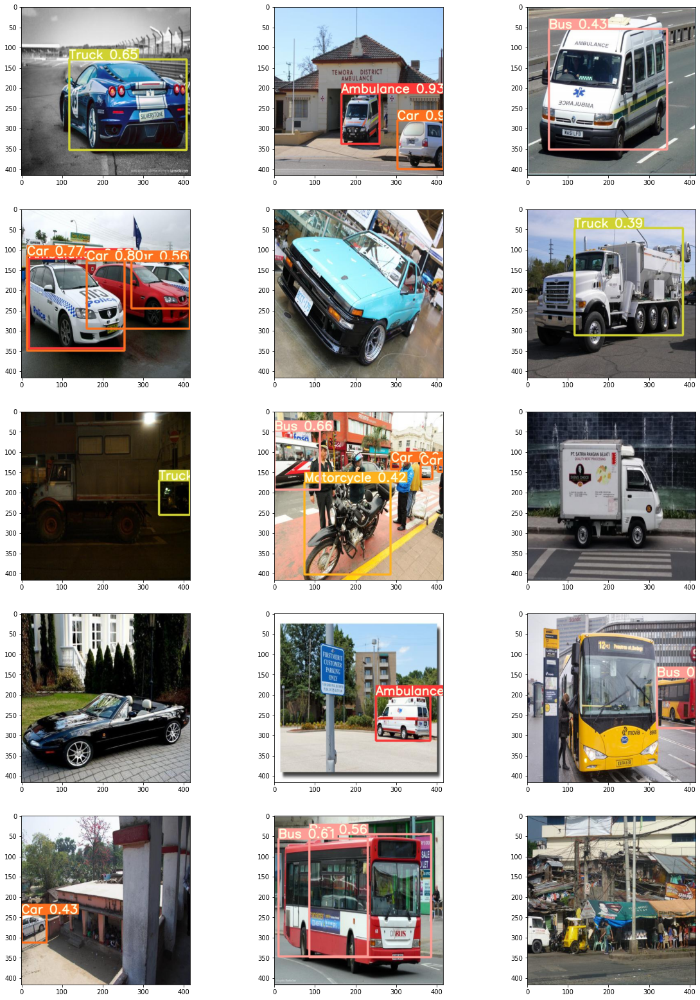

In [ ]:
disp_images = glob('/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/runs/detect/exp0.3/*.jpg')
fig=plt.figure(figsize=(20, 28))
columns = 3
rows = 5
for i in range(1, columns*rows +1):
    img = np.random.choice(disp_images) #random images are selected for visualization
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show() 

In [ ]:
#Creating a CSV file containing test set predictions
path = "/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/runs/detect/exp0.3/labels/"

annotations = sorted(glob(path + "*.txt"))

df = []
for file in annotations:
  
  filename = file.split('/')[-1] + '.jpg' #strips the path from the filename

  f=open(file,"r")
  Lines = f.readlines()
  row = []
  # Strips the newline character 
  for line in Lines: 
    x=line.split()
    labels = x[0]
    x_center = x[1]
    y_center = x[2]
    width = x[3]
    height = x[4]
    row = [filename, labels, x_center, y_center, width, height]

    df.append(row)

In [ ]:
# #saving the dataframe in a csv file
data = pd.DataFrame(df,columns=['filename', 'label', 'x_center', 'y_center', 'width', 'height'])
# data[['filename', 'label', 'x_center', 'y_center', 'width', 'height']].to_csv('/content/drive/MyDrive/Projetcs/Animo.ai/results.csv', index=False)

In [ ]:
data

,filename,label,x_center,y_center,width,height
0,00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.txt,0,0.554087,0.627404,0.65625,0.629808
1,00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.txt,1,0.55649,0.528846,0.762019,0.764423
2,00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.txt,1,0.121394,0.520433,0.242788,0.425481
3,08c8b73e0c2e296e_jpg.rf.effa65856584463c088480...,1,0.75601,0.520433,0.257212,0.382212
4,08c8b73e0c2e296e_jpg.rf.effa65856584463c088480...,1,0.483173,0.50601,0.423077,0.536058
...,...,...,...,...,...,...
87,fca5c9c8f0276eff_jpg.rf.vA6S9lDbrVuvoA2aoplG.txt,2,0.0745192,0.665865,0.149038,0.168269
88,fcbbda4f0678bfcf_jpg.rf.oaHMZCzfjwXi0airgLrZ.txt,2,0.824519,0.448317,0.346154,0.28125
89,fcbbda4f0678bfcf_jpg.rf.oaHMZCzfjwXi0airgLrZ.txt,0,0.328125,0.558894,0.564904,0.53125
90,fcbbda4f0678bfcf_jpg.rf.oaHMZCzfjwXi0airgLrZ.txt,2,0.322115,0.557692,0.576923,0.5625


In [ ]:
data.dtypes

filename    object
label       object
x_center    object
y_center    object
width       object
height      object
dtype: object

#####Counting

In [ ]:
#creating a CSV file containing counts
path = "/content/drive/MyDrive/Projetcs/Animo.ai/yolov5/runs/detect/exp0.3/labels/"

annotations = sorted(glob(path + "*.txt"))

count = {} #dictionary to keep count of classes in each image

for file in annotations:
  classes = {'0':0, '1':0, '2':0, '3':0, '4':0}
  filename = file.split('/')[-1] #strips the path from the filename
  f=open(file,"r")
  Lines = f.readlines()
  
  for line in Lines: 
    x=line.split() # Strips the newline character 
    labels = x[0]
    classes[str(labels)] += 1
 
  if filename in count: #checking whether file already exists in the dictionary
    count[filename].append(classes)
  else:
    count[filename] = classes

rows = []
for key in count:
  row = list(count[key].values()) #turns the dictionary values into a list
  rows.append(row)

pt = data[['filename','label']] #new dataframe containing filename and class only

names = pt['filename'].unique() #find the filenames where objects have been detected
print(len(names))
print(len(rows))

df = pd.DataFrame({'Filenames':names})
df1 = pd.DataFrame(rows, columns = ['Ambulance','Bus', 'Car', 'Motorcycle', 'Truck'])
result = pd.concat([df, df1], axis=1) #concatenate the two dataframes side by side
result

49
49


,Filenames,Ambulance,Bus,Car,Motorcycle,Truck
0,00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.txt,1,0,0,0,0
1,00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.txt,0,2,0,0,0
2,08c8b73e0c2e296e_jpg.rf.effa65856584463c088480...,0,2,0,0,0
3,10c26c6598677a1f_jpg.rf.USCbBYVcUICkLhuq07Lw.txt,0,0,0,1,0
4,259ff749ac781352_jpg.rf.CZyKDHyPjIcTpIwNJ2rd.txt,0,0,2,0,0
5,2c21c734126f9f69_jpg.rf.9G8Ajct2ynuOcQoTES9z.txt,1,0,1,0,0
6,2eaf88e3156629c6_jpg.rf.73ce41f3e4820d02eecbb0...,0,0,0,0,3
7,31d30eccf56cac5f_jpg.rf.DPfttPJtcKnLajb1gulu.txt,0,0,0,4,0
8,3281f85bb3265523_jpg.rf.h2dkv1fIXvgeK5x8f1Te.txt,0,0,2,0,0
9,3429c6851095a4c3_jpg.rf.fqPa3xt3eK2RXoQ756m6.txt,0,0,1,0,0


In [ ]:
result.to_csv('/content/drive/MyDrive/Projetcs/Animo.ai/count.csv', index=False)